### Used Floyd cloud GPU

In [1]:
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import load_img, img_to_array
from keras.models import Sequential, Model
from keras.layers import MaxPool2D, AvgPool2D, Conv2D
import keras.backend as K
from scipy.optimize import fmin_l_bfgs_b
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Using TensorFlow backend.


In [2]:
def preprocess_image(img_path, height=None, width=None):
    if width is None and height is None:
        target_size = None
    else:
        if width is None and height is not None:
            w, h = load_img(path=img_path).size
            width = int(w * height/h)
        elif width is not None and height is None:
            w, h = load_img(path=img_path).size
            height = int(h * width/w)
        
        target_size = (height, width)
        
    img = load_img(path=img_path, target_size=target_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    
    return img

In [3]:
def unpreprocess_image(img):
    img += np.array([103.939, 116.779, 123.68]).reshape(1,1,3)
    img = img[...,::-1]
    img -= img.min()
    img /= img.max()
    
    return img

In [4]:
def vgg16_avgpool(input_shape):
    maxpool_model = VGG16(input_shape=input_shape, weights='imagenet', include_top=False)
    avgpool_model = Sequential()
    
    for layer in maxpool_model.layers:
        if layer.__class__ == MaxPool2D:
            avgpool_model.add(AvgPool2D())
        else:
            layer.trainable=False
            avgpool_model.add(layer)
    
    return avgpool_model

In [5]:
def sum_squared_error(a, b):
    return K.sum(K.square(a - b))

In [6]:
def get_content_loss(C, G):
    return sum_squared_error(C, G)

In [7]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    return K.dot(features, K.transpose(features))

In [8]:
def get_style_loss(S, G):
    _, h, w, c = S.get_shape().as_list()
    sse = sum_squared_error(gram_matrix(S[0]), gram_matrix(G[0]))
    return sse / ((2.0 * h * w * c)**2)

In [9]:
def get_total_variation_loss(x):
    return K.sum(K.abs(x[:,:-1,:,:] - x[:,1:,:,:])) + K.sum(K.abs(x[:,:,:-1,:] - x[:,:,1:,:]))

In [10]:
def minimize(func, x, num_iter=20, image_interval=5, show_loss=True):
    images = []
    for i in range(num_iter):
        x, l, _ = fmin_l_bfgs_b(func=func, x0=x, maxfun=20)
        if show_loss:
            print('iteration: {}, loss: {}'.format(i+1, l))
        x = np.clip(x, -127, 127)
        if (i + 1) % image_interval == 0:
            images.append(x.copy())
    
    return images

In [11]:
def style_transfer(content_img_path,
                   style_img_path,
                   height=None, width=None,
                   style_loss_weights=[0.1, 0.15, 0.2, 0.25, 0.3],
                   alpha=0.001, beta=1.0,
                   denoise_weight=0.001,
                   num_iter=20, image_interval=5,
                   show_loss=True):
    
    content_image = preprocess_image(content_img_path, height, width) 
    height, width = content_image.shape[1:3]
    
    model = vgg16_avgpool(input_shape=(height, width, 3))
    layers = {layer.name: layer for layer in model.layers}
    
    content_loss_layer_output = layers['block4_conv2'].get_output_at(1)
    content_model = Model(inputs=model.input, outputs=content_loss_layer_output)
    content_feature = K.variable(content_model.predict(content_image))
    content_loss = get_content_loss(content_feature, content_model.output)
    
    style_image = preprocess_image(style_img_path, height, width)
    style_loss_layers_outputs = [layer.get_output_at(1) for name,layer in layers.items() if name.endswith('conv1')]
    style_model = Model(inputs=model.inputs, outputs=style_loss_layers_outputs)
    style_features = [K.variable(feature) for feature in style_model.predict(style_image)]   
    style_loss_weights = style_loss_weights
    
    style_loss = 0
    for S, G, w in zip(style_features, style_model.output, style_loss_weights):
        style_loss += w * get_style_loss(S, G)
        
    total_variation_loss = get_total_variation_loss(model.input)
    
    loss = alpha * content_loss + beta * style_loss + denoise_weight * total_variation_loss
    grads = K.gradients(loss, model.input)
    
    loss_grad_func = K.function(inputs=[model.input], outputs=[loss] + grads)
    
    def loss_grad_func_wrapper(x_1d):
        x_3d = x_1d.reshape(1, height, width, 3)
        l, g = loss_grad_func(inputs=[x_3d])
        return l, g.flatten().astype('float64')
    
    x = np.random.normal(size=(1*height*width*3))
    generated_images = minimize(loss_grad_func_wrapper, x, num_iter, image_interval, show_loss)
    
    reshaped_images = [image.reshape(height, width, 3) for image in generated_images]
    unpreprocessed_images = list(map(unpreprocess_image, reshaped_images))
    
    return unpreprocessed_images

In [12]:
def cont_style_gen(cont_path, style_path, gen):
    plt.figure(figsize=(20,20))
    plt.subplot(1,3,1)
    plt.imshow(load_img(content_img_path))

    plt.subplot(1,3,2)
    plt.imshow(load_img(style_img_path))

    plt.subplot(1,3,3)
    plt.imshow(gen)

In [13]:
content_img_path = './star_wars.jpg'
style_img_paths = ['./1280px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg',
                   './abstract-architecture-background-1154739.jpg',
                   './abstract-art-artistic-1328891.jpg',
                   './cobblestone-earth-surface-granite-1029604.jpg']

In [14]:
generated_images = []

image 0 done
image 1 done
image 2 done
image 3 done


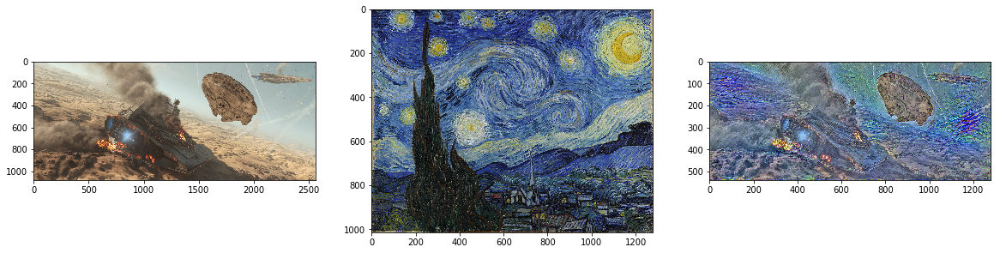

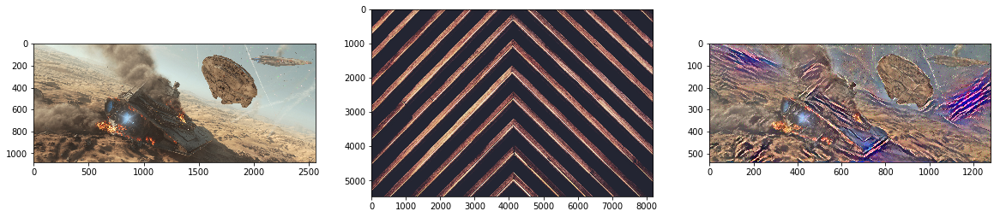

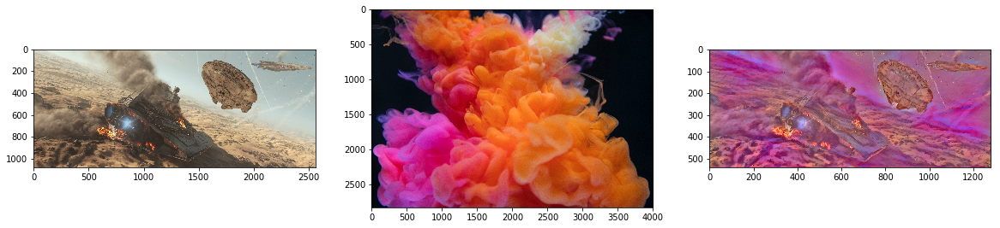

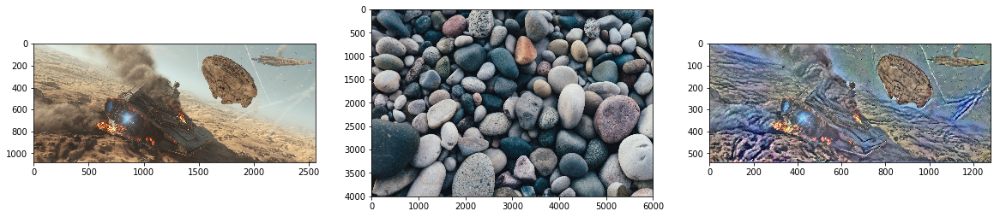

In [15]:
for i, style_img_path in enumerate(style_img_paths):
    generated_image = style_transfer(content_img_path, style_img_path, width=1280, alpha=0.005, num_iter=10, show_loss=False)
    generated_images.append(generated_image[-1])
    cont_style_gen(content_img_path, style_img_path, generated_images[-1])
    print('image {} done'.format(i))

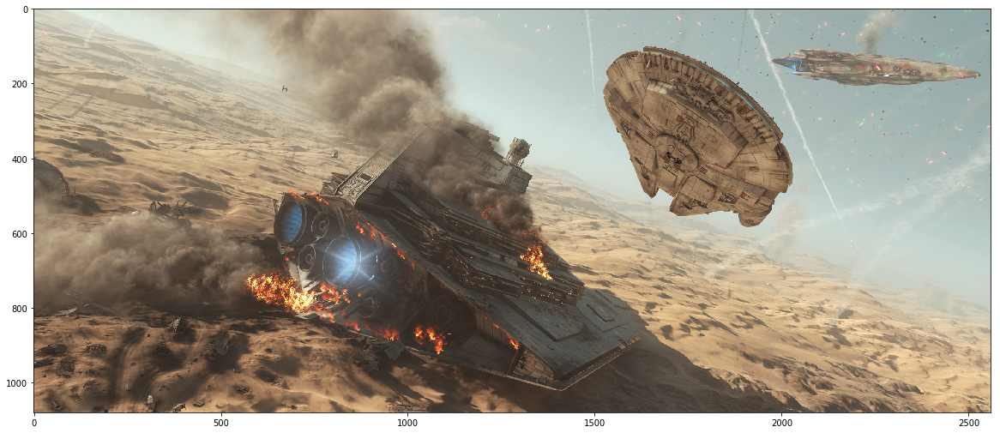

In [16]:
plt.figure(figsize=(20,10))
plt.imshow(load_img(content_img_path))

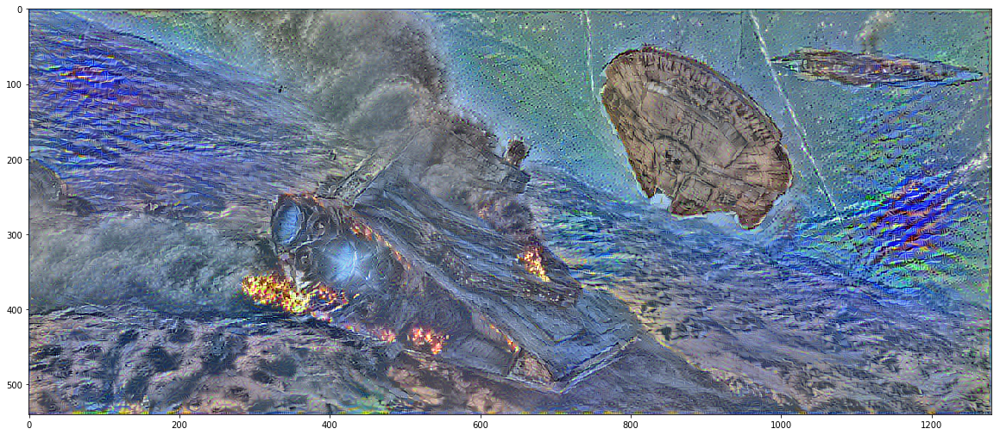

In [17]:
plt.figure(figsize=(20,10))
plt.imshow(generated_images[0])

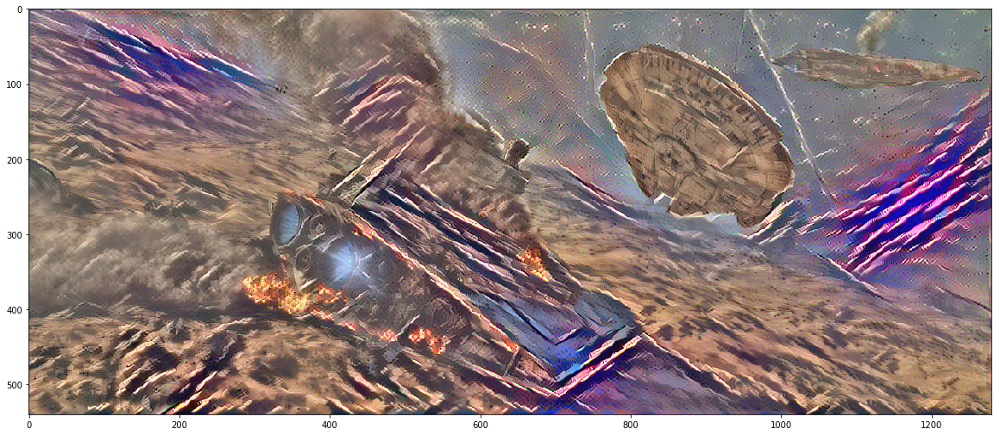

In [18]:
plt.figure(figsize=(20,10))
plt.imshow(generated_images[1])

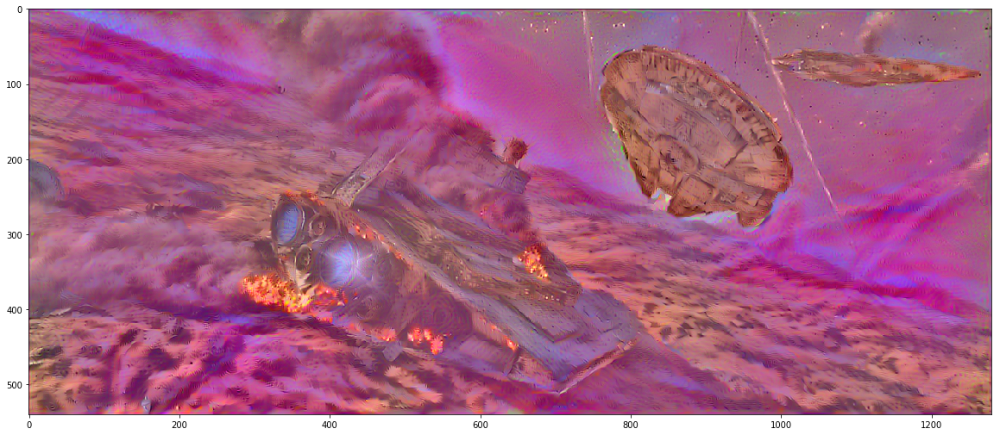

In [19]:
plt.figure(figsize=(20,10))
plt.imshow(generated_images[2])

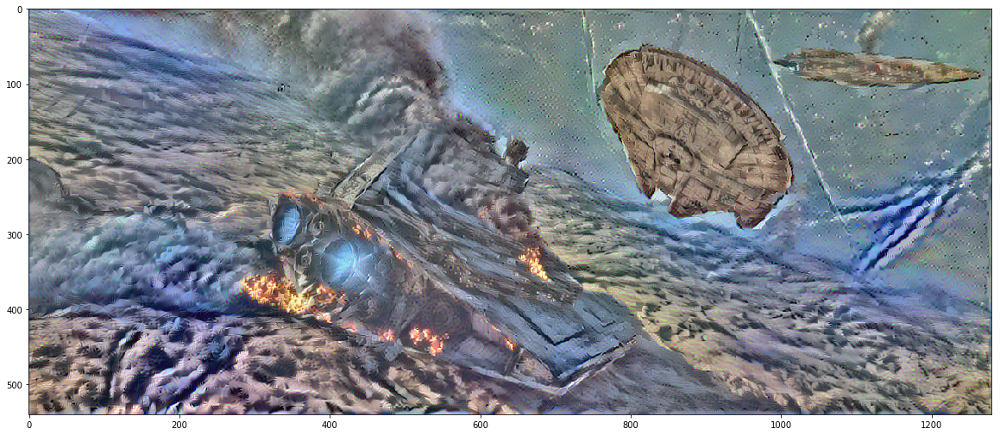

In [20]:
plt.figure(figsize=(20,10))
plt.imshow(generated_images[3])